**Проект "Как рассказать историю с помощью данных"**

Цель работы: Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведение общественного питания.

**Описание данных:**

1. name — название заведения
2. address — адрес заведения
3. category — категория заведения, например «кафе», «пиццерия» или «кофейня»
4. hours — информация о днях и часах работы
5. lat — широта географической точки, в которой находится заведение
5. lat — широта географической точки, в которой находится заведение
6. lng — долгота географической точки, в которой находится заведение
7. rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
8. price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
9. avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
10. middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
11. middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»
12. chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)
13. district — административный район, в котором находится заведение, например Центральный административный округ
14. seats — количество посадочных мест

План работы:

- Открываем файл с данными и изучаем общую информацию
- Выполняем предобработку данных
- Анализируем полученные данные
- Проводим исследования по вероятности успеха в случае открытия кофейни
- Подготавливаем презентацию

### Открываем файл с данными и изучаем общую информацию

In [1]:
import pandas as pd
import numpy as np
from datetime import date, datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sb
import datetime as dt
import plotly.express as px
import warnings
warnings.filterwarnings(action = 'ignore')
import requests
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
#выводим и просмариваем первые строки датафрейма
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')    
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
#просматриваем информацию о файле, какой у каждого столбца тип данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#посчитаем количество пустых значений
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропусков в датафрейме большое количество. Просто так их удалить нельзя - будут искажения в исследовании.

In [5]:
#проверяем наличие явных дубликатов 
data.duplicated().sum()

0

Дубликатов нет

In [6]:
print('Количество заведений:', data['name'].nunique())

Количество заведений: 5614


В датасете представлена информация о 5614 заведениях общественного питания в Москве. В столбцах name, category, address, district, hours, price и avg_bill содержится информация о названии, категории, адресе, административном районе, часах работы, ценовой категории и средней стоимости заказа, представленных в формате object. Столбцы lat и lng предоставляют данные о географических координатах заведения, middle_avg_bill и middle_coffee_cup содержат данные о средней стоимости заказа и чашки капучино. Столбец chain содержит целочисленные значения 1 и 0, указывающие, относится ли заведение к сети или нет. Однако, столбец seats содержит данные о количестве посадочных мест в виде чисел с плавающей точкой, что является ошибкой. Также, в некоторых столбцах есть пропущенные значения в огромных количествах.

### Выполняем предобработку данных

Как было расчитано ранее - дубликатов в датафрейме нет.

Однако пропуски - есть. Рассмотрим их.

In [7]:
#посчитаем количество пустых значений
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Столбец middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт».

In [8]:
#приведем столбец к нижниму регистру и заполним пропуски на 'нет данных' для возможности провести расчет
data['avg_bill'] = data['avg_bill'].str.lower()
data['avg_bill'] = data['avg_bill'].fillna('нет данных')
#выведем количество непустых значений столбца middle_avg_bill
print('Количество не пустых строк:', len(data.query('~middle_avg_bill.isna()')))
#посчитаем количество строк, где значение в столбце avg_bill начинается со 'средний счёт'
print('Количество строк, начинающихся с подстроки "средний счет":', 
      len(data.loc[data['avg_bill'].apply(lambda x: x.find('средний счёт')) != -1]))

Количество не пустых строк: 3149
Количество строк, начинающихся с подстроки "средний счет": 3149


По полученным данным видно, что количество не пустых строк столбца middle_avg_bill датафрема равно количеству строк начинающихся с подстроки "средний счет" столбца avg_bill. Можно сделать вывод, что везде, где необходимо данные по этому столбцу (middle_avg_bill) - заполнены. Пропуски заполнить невозможно.

Далее рассмотрим столбец middle_coffee_cup, где число с оценкой одной чашки капучино указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена чашки капучино».

In [9]:
#выведем количество непустых значений столбца middle_avg_bill
print('Количество не пустых строк:', len(data.query('~middle_coffee_cup.isna()')))
#посчитаем количество строк, где значение в столбце avg_bill начинается со 'цена чашки капучино'
print('Количество строк, начинающихся с подстроки "цена чашки капучино":',
      len(data.loc[data['avg_bill'].apply(lambda x: x.find('цена чашки капучино')) != -1]))

Количество не пустых строк: 535
Количество строк, начинающихся с подстроки "цена чашки капучино": 535


Везде, где должно быть - данные заполнены.

Скорее всего пропуски возникли из-за разных категорий, прописанных в столбце avg_bill.

In [10]:
data['avg_bill'].unique()

array(['нет данных', 'средний счёт:1500–1600 ₽', 'средний счёт:от 1000 ₽',
       'цена чашки капучино:155–185 ₽', 'средний счёт:400–600 ₽',
       'средний счёт:199 ₽', 'средний счёт:200–300 ₽',
       'средний счёт:от 500 ₽', 'средний счёт:1000–1200 ₽',
       'цена бокала пива:250–350 ₽', 'средний счёт:330 ₽',
       'средний счёт:1500 ₽', 'средний счёт:300–500 ₽',
       'средний счёт:140–350 ₽', 'средний счёт:350–500 ₽',
       'средний счёт:300–1500 ₽', 'средний счёт:от 240 ₽',
       'средний счёт:200–250 ₽', 'средний счёт:328 ₽',
       'средний счёт:300 ₽', 'средний счёт:от 345 ₽',
       'средний счёт:60–400 ₽', 'средний счёт:900 ₽',
       'средний счёт:500–800 ₽', 'средний счёт:500–1000 ₽',
       'средний счёт:600–700 ₽', 'цена бокала пива:120–350 ₽',
       'средний счёт:1000–1500 ₽', 'средний счёт:1500–2000 ₽',
       'цена чашки капучино:150–190 ₽', 'средний счёт:2000–2500 ₽',
       'средний счёт:600 ₽', 'средний счёт:450 ₽',
       'цена чашки капучино:120–170 ₽', 'ср

Это действительно так - в столбце помимо категорий 'средний счёт' и 'цена чашки капучино' есть и 'цена бокала пива', что говорит о том, что пропуски вызваны из-за разных категорий - пропуски заполнять будет некорректно, оставим как есть.

In [11]:
#рассмотрим также данные столбца seats
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Видим, что в данных содержаться выбросы. 

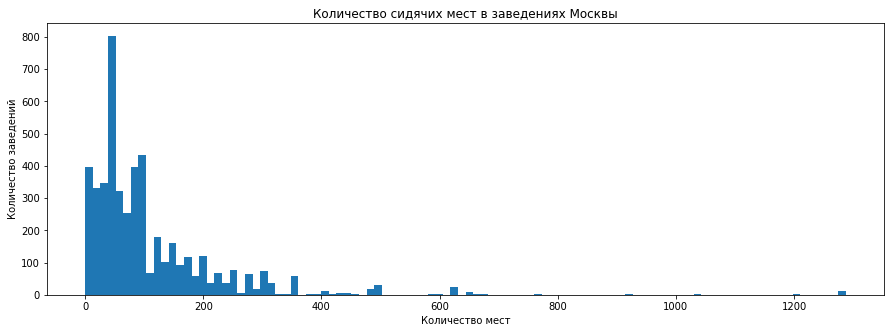

In [12]:
#построим график для наглядности
plt.figure(figsize = (15,5))
plt.hist(data['seats'], bins = 100)
plt.title('Количество сидячих мест в заведениях Москвы')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений');

По графику выдны выбросы - поставим ограничения в 500.

In [13]:
print('Количество заведений с числом мест больше 500:', data[data['seats'] > 500]['name'].count())

Количество заведений с числом мест больше 500: 56


Таких заведений всего 56 - всего 1% данных, поэтому смело удаляем такие данные с выбросами.

In [14]:
data = data[(data['seats'] < 500) | (data['seats'].isna())].reset_index()

In [15]:
#cоздадим столбец street с названиями улиц из столбца с адресом
data['street'] = data['address'].str.split(', ').str[1]
data.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,нет данных,NaN,NaN,0,NaN,улица Дыбенко
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [16]:
#создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head(11)

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,нет данных,NaN,NaN,0,NaN,улица Дыбенко,False
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,нет данных,NaN,NaN,0,NaN,Ижорская улица,False
6,6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


In [17]:
print('Количество записей датафрейма:', len(data))
#приведем названия заведений к единой форме
data['name'] = data['name'].str.lower()
#посчитаем количество неявных дубликатов
print('Количество неявных дубликатов:', data.duplicated(subset = ['name', 'address']).sum())

Количество записей датафрейма: 8329
Количество неявных дубликатов: 3


In [18]:
#удалим дубликаты
data = data.drop_duplicates(subset = ['name', 'address'])
print('Новое количество записей датафрейма:', len(data))

Новое количество записей датафрейма: 8326


Предобработка завершена - столбцы с названиями улиц и с обозначением, что заведение работает ежедневно и круглосуточно (24/7) созданы; пропуски, где возможно, закрыты; данные с выбросами и неявные дубликаты удалены. 

### Анализ данных

**Первым шагом:**

Ответим какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [19]:
print('Всего записей:', len(data.index))

Всего записей: 8326


In [20]:
category_name = data['category'].value_counts().reset_index()
category_name.columns = ['category', 'count']
category_name['ratio'] = ((category_name['count'] / len(data.index)) * 100).round(2)
category_name

,category,count,ratio
0,кафе,2355,28.28
1,ресторан,2021,24.27
2,кофейня,1398,16.79
3,"бар,паб",754,9.06
4,пиццерия,629,7.55
5,быстрое питание,601,7.22
6,столовая,313,3.76
7,булочная,255,3.06


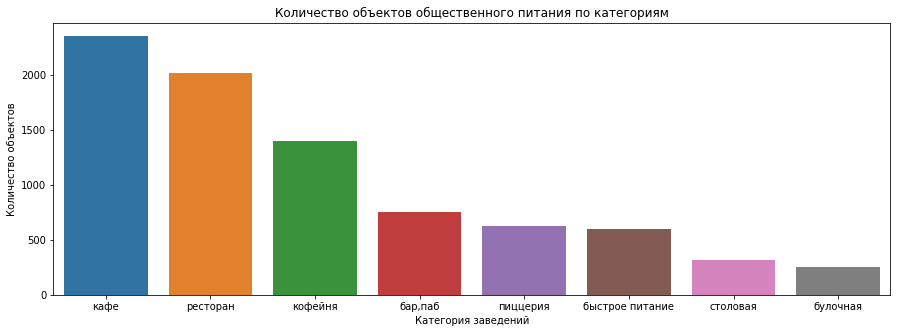

In [21]:
#построим график
plt.subplots(figsize = (15, 5))
plot_1 = sb.barplot(data=category_name, x = 'category', y = 'count')
plot_1.set_xlabel('Категория заведений')
plot_1.set_ylabel('Количество объектов')
plot_1.set_title('Количество объектов общественного питания по категориям');

По количеству заведений лидируют кафе с численностью 2356, следующий идет категория ресторан - 2022. На последнем месте булочная - 255.

Кафе и рестораны составляют больше половины от всех заведений. Кофейни составляют около 17%. Бара, пабы - 9% , пиццерии по 7,5%, а столовые и булочные около 3,5% каждый.

**Вторым шагом:**

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.

In [22]:
median_seats = data[data['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by = 'seats', ascending = False).round()
median_seats

,category,seats
6,ресторан,86.0
0,"бар,паб",80.0
4,кофейня,80.0
7,столовая,76.0
2,быстрое питание,75.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,51.0


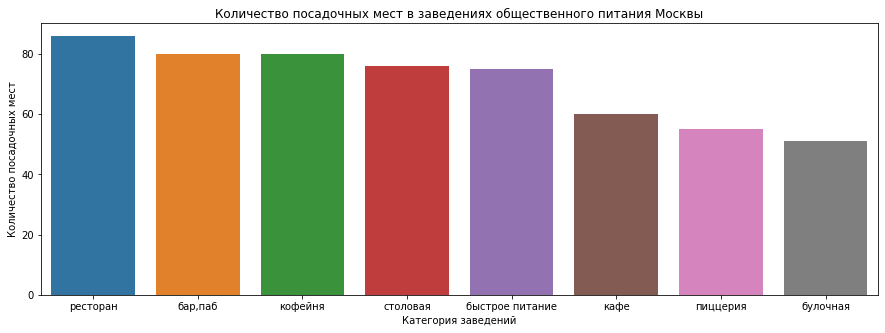

In [23]:
#построим график
plt.subplots(figsize=(15, 5))
plot_2 = sb.barplot(data = median_seats, x = 'category', y = 'seats')
plot_2.set_xlabel('Категория заведений')
plot_2.set_ylabel('Количество посадочных мест')
plot_2.set_title('Количество посадочных мест в заведениях общественного питания Москвы');

По графику заметно, что по количеству посадочных мест в заведении лидируют рестораны с 86 местами для посадки, следующими идут категории бары, пабы и кофейни - 80 мест. За ними идут столовые и быстрое питание с 76 и 75 местами для посадки соответственно. На последнем месте булочная с 51 местом для посадки.

**Третим шагом:**

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете, где 1 - заведение является сетевым и 0 - заведение не является сетевым. Ответим каких заведений больше?

In [24]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain['ratio'] = ((chain['count'] / len(data.index)) * 100).round(2)
chain

,chain,count,ratio
0,0,5157,61.94
1,1,3169,38.06


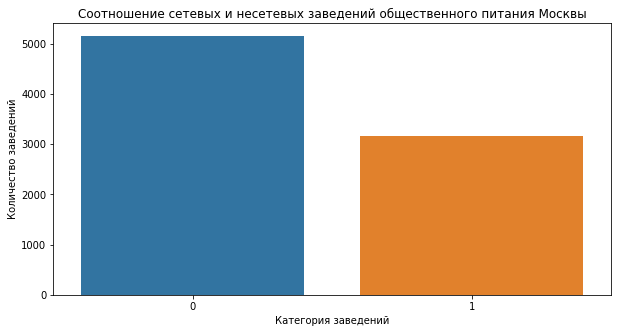

In [25]:
#построим график
plt.subplots(figsize = (10, 5))
plot_3 = sb.barplot(data = chain, x = 'chain', y = 'count')
plot_3.set_xlabel('Категория заведений')
plot_3.set_ylabel('Количество заведений')
plot_3.set_title('Соотношение сетевых и несетевых заведений общественного питания Москвы');

Смотря на график можно прийти к выводу, что около 62% (5158) всех заведений Москвы является не сетевым и, следовательно, 38% (3171) принадлежат какой либо сети.

**Четвертым шагом:**

Ответим на вопрос какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.

In [26]:
category_chain = data.groupby(['category', 'chain'])['name'].count().reset_index()
category_chain.columns = ['category', 'chain', 'count']
category_chain['chain'] = category_chain['chain'].astype(object)
category_chain = category_chain.sort_values(['count', 'chain'])
category_chain

,category,chain,count
15,столовая,1,87
2,булочная,0,99
3,булочная,1,156
1,"бар,паб",1,167
14,столовая,0,226
5,быстрое питание,1,231
10,пиццерия,0,301
11,пиццерия,1,328
4,быстрое питание,0,370
0,"бар,паб",0,587


In [27]:
#построим график
fig_4 = px.bar(category_chain,
             x = 'count',
             y ='category',
             text = 'count',
             color ='chain',
             category_orders = {"chain":['сетевой', 'несетевой']}
            )
fig_4.update_layout(title = 'Соотношение сетевых и несетевых заведений',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Категория заведений')
fig_4.show()

По графику заметно, сетевыми наиболее часто являются заведения с категорией кафе (770 против 1586), следующим идут рестораны и кофейни (720 против 1302 и 711 против 687 соответственно). В категории пиццерия сетевых точек больше, чем несетевых (328 против 301).

**Пятым шагом:**

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Ответим на вопрос есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [28]:
data_chain = data[data['chain'] == 1]
top_15 = data_chain.groupby('name').agg({'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns = {'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,category,count
0,шоколадница,кофейня,118
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,70
4,яндекс лавка,ресторан,68
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,38


In [29]:
#построим график
fig_5 = px.bar(top_15,
             x = 'name',
             y ='count',
             text = 'name',
             color ='count'
            )
fig_5.update_layout(title = 'Соотношение популярных сетей',
                  xaxis_title = 'Наименование заведений',
                  yaxis_title = 'Количество заведений')
fig_5.show()

Смотря на данный график, можно придти к выводу, что наиболее популярной сетью в Москве является кофейня "Шоколадница" с результатом 118 заведений в районе, далее идут пиццерии "Домино'с Пицца" и "Додо Пицца" с 76 и 74 заведениями. На последнем месте стоит сеть кафе "Му-Му", которая имеет 27 заведений в районе.

**Шестым шагом:**

Выяним какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [30]:
print('Всего районов в датасете:', data['district'].nunique())
print('Наименование районов в датасете:', data['district'].unique())

Всего районов в датасете: 9
Наименование районов в датасете: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [31]:
district_chain = data_chain.groupby(['district', 'category']).agg({'address' : 'count'})
district_chain = district_chain.sort_values('address', ascending = False).reset_index()
district_chain = district_chain.rename(columns={'address':'count'})
district_chain

,district,category,count
0,Центральный административный округ,кофейня,219
1,Центральный административный округ,кафе,216
2,Центральный административный округ,ресторан,215
3,Северный административный округ,кофейня,93
4,Западный административный округ,кофейня,91
...,...,...,...
67,Юго-Восточный административный округ,булочная,5
68,Западный административный округ,столовая,4
69,Юго-Восточный административный округ,столовая,3
70,Северо-Западный административный округ,столовая,3


In [32]:
fig_6 = px.bar(district_chain,
             x = 'count',
             y = 'district',                 
             color = 'category'
            )
fig_6.update_layout(title = 'Количество заведений каждой категории по районам',
                   xaxis_title = 'Количество заведений',
                   yaxis_title = 'Название района',
                   yaxis = {'categoryorder':'total ascending'}
                 )
fig_6.show()

Всего в датасете присутствуют 9 административных районов Москвы: Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ. Наибольшее количество заведений каждой категории находятся в Центральном административном округе (с преобладанием кафе, кофеен и ресторанов), далее идет Западный и Северо-Восточный. Наименьшее количество в Северо-Западном административном округе. Столовые имеют наименьшее количество заведений в каждом округе.

**Седьмым шагом:**

Визуализируем распределение средних рейтингов по категориям заведений. Посмотрим, сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [33]:
category_rating = data_chain.groupby('category')['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False).round(2)
category_rating

,category,rating
0,"бар,паб",4.39
1,булочная,4.29
5,пиццерия,4.28
7,столовая,4.24
6,ресторан,4.22
4,кофейня,4.21
3,кафе,4.20
2,быстрое питание,4.06


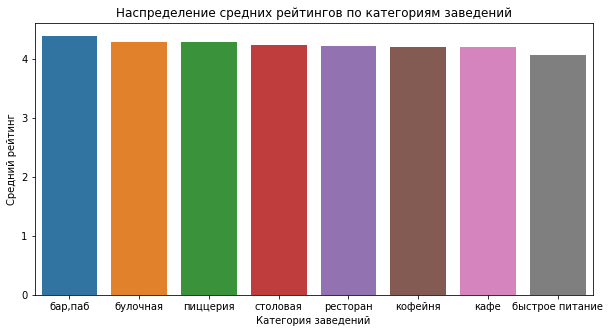

In [34]:
#построим график
plt.subplots(figsize = (10, 5))
plot_7 = sb.barplot(data = category_rating, x = 'category', y = 'rating')
plot_7.set_xlabel('Категория заведений')
plot_7.set_ylabel('Средний рейтинг')
plot_7.set_title('Hаспределение средних рейтингов по категориям заведений');

По графику видем, что у всех категорий заведений города Москва рейтинги довольно схожи. Однако, все равно можно выделить лидера - категория бары, пабы со средним рейтингом 4.39. На последнем месте находится категория быстрое питание средним рейтингом 4.06

**Восьмым шагом:**

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [35]:
district_rating = data_chain.groupby('district')['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False).round(2)
district_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.23
2,Северный административный округ,4.21
1,Западный административный округ,4.20
8,Южный административный округ,4.20
3,Северо-Восточный административный округ,4.17
7,Юго-Западный административный округ,4.16
0,Восточный административный округ,4.16
6,Юго-Восточный административный округ,4.05


In [36]:
#загружаем необходимый файл
geomap = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.7512, 37.6184
#создаем карту Москвы
map_moscow = Map(location=[moscow_lat, moscow_lng], zoom_start = 10)
#создаём хороплет и добавляем его на карту
Choropleth(
    geo_data = geomap,
    data = district_rating,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    legend_name = 'Средний рейтинг заведений каждого района',
).add_to(map_moscow)
map_moscow

Самый высокий рейтинг имеют заведния, находящиеся в Центральном округе, наименьший - в Юго-Восточном.

**Девятым шагом:**

Отобразим все заведения датасета на карте.

In [37]:
#создаем пустой кластер и добавляем его на карту map_moscow
marker_cluster = MarkerCluster().add_to(map_moscow)
#пишем функцию, которая создает точки
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
#применяем функцию к каждой строке датафрейма
data.apply(create_clusters, axis=1)
map_moscow

**Десятым шагом:**

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [38]:
#выведем топ-15 улиц Москвы по количеству заведений
streets = data[data['street'].notnull()]
top_15_streets = streets['street'].value_counts().reset_index().head(15)
top_15_streets.columns = ['street', 'count']
top_15_streets

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,Ленинский проспект,107
3,проспект Вернадского,97
4,Дмитровское шоссе,88
5,Каширское шоссе,77
6,Варшавское шоссе,76
7,Ленинградский проспект,72
8,Ленинградское шоссе,70
9,МКАД,65


In [39]:
#выведем данные по наибольшему количеству заведений вместе с категорией и улицей, на которой они располагаются
streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street', 'category', 'count']
streets_category.sort_values('count', ascending = False)

,street,category,count
2857,проспект Мира,кафе,53
1377,МКАД,кафе,45
2860,проспект Мира,ресторан,45
2858,проспект Мира,кофейня,36
1986,Профсоюзная улица,кафе,35
...,...,...,...
1530,Мукомольный проезд,булочная,1
1531,Мукомольный проезд,быстрое питание,1
1532,Мукомольный проезд,пиццерия,1
1533,Мурановская улица,ресторан,1


In [40]:
#выведем топ-15 по количеству заведений и их категорий по этим улицам
top15_category_streets = streets_category[streets_category['street'].isin(top_15_streets['street'])]
top15_category_streets

,street,category,count
319,Алтуфьевское шоссе,"бар,паб",5
320,Алтуфьевское шоссе,булочная,1
321,Алтуфьевское шоссе,быстрое питание,5
322,Алтуфьевское шоссе,кафе,13
323,Алтуфьевское шоссе,кофейня,9
...,...,...,...
3052,улица Вавилова,быстрое питание,11
3053,улица Вавилова,кафе,15
3054,улица Вавилова,кофейня,10
3055,улица Вавилова,пиццерия,3


In [41]:
#построим график
fig_7 = px.bar(top15_category_streets, 
             x = 'count', 
             y = 'street',                    
             color = 'category'
            )

fig_7.update_layout(title = 'Количества заведений и их категория по то-15 улицам Москвы',
                   xaxis_title = 'Количество заведений',
                   yaxis_title = 'Название улиц',
                   yaxis = {'categoryorder':'total ascending'}
                 )
fig_7.show()

По графику видно, что что больше всего заведений на проспекте Мира, где преобладают кафе и рестораны. Далее идет Профсоюзная улица, Ленинский проспект, где также преобладают кафе и рестораны. На последнем месте в топ-15 улиц располагается Алтуфьевское шоссе, где также преобладают кафе и рестораны

**Одиннацатым шагом:**

Найдем улицы, на которых находится только один объект общепита.

In [42]:
streets_1_cafe = data['street'].value_counts().reset_index()
streets_1_cafe.columns = ['street', 'count']
streets_1_cafe = streets_1_cafe[streets_1_cafe['count']==1]
streets_1_cafe

,street,count
989,Оршанская улица,1
990,улица Зорге,1
991,2-й Рощинский проезд,1
992,улица Кондратюка,1
993,Боровское шоссе,1
...,...,...
1443,улица Генерала Глаголева,1
1444,Мажоров переулок,1
1445,Раушская набережная,1
1446,Выползов переулок,1


Всего 458 улиц, на которых находится только один объект общепита. Например, к таким можно отнести улицу Старые Кузьминки, сквер имени М.И.Калинина, Графский переулок и другие.

**Двенадцатым шагом:**

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Узнаем, как удалённость от центра влияет на цены в заведениях?

In [43]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [44]:
#создаем карту Москвы
map_moscow_2 = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)
#создаём хороплет и добавляем его на карту
Choropleth(
    geo_data = geomap,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(map_moscow_2)
map_moscow_2

По данным полученным мы видим, что самый высокий средний чек в Западном и Центральном административных округах. Самый маленький в Юго-Восточном. В сравнении с Центром средний чек в заведениях отличается в 1.5-2 раза.

**Вывод:**

- Всего было проанализировано 8329 заведений общественного питания Москвы в 9 административных районах;
- По количеству заведений лидируют кафе с численностью 2356, следующий идет категория ресторан - 2022. На последнем месте булочная - 255;
- Кафе и рестораны составляют больше половины от всех заведений. Кофейни составляют около 17%, а столовые и булочные около 3,5% каждый;
- По количеству посадочных мест в заведении лидируют рестораны, следующими идут категории бары, пабы и кофейни. На последнем месте булочные;
- Около 62% всех заведений Москвы является не сетевым;
- Cетевыми наиболее часто являются заведения с категорией кафе, следующим идут рестораны и кофейни;
- Наиболее популярной сетью в Москве является кофейня "Шоколадница", далее идут пиццерии "Домино'с Пицца" и "Додо Пицца". На последнем месте стоит сеть кафе "Му-Му";
- Наибольшее количество заведений каждой категории находятся в Центральном административном округе, далее идет Западный и Северо-Восточный. Наименьшее количество в Северо-Западном административном округе";
- Самый высокий рейтинг заведений имеет категория бары, пабы. На последнем месте находится категория быстрое питание;
- Самый высокий рейтинг имеют заведния, находящиеся в Центральном округе, наименьший - в Юго-Восточном;
- Больше всего заведений на проспекте Мира, с преобладанием кафе и рестораны. На последнем месте в располагается Алтуфьевское шоссе, где также преобладают кафе и рестораны;
- В Москве 458 улиц, на которых находится только один объект общепита;
- Самый высокий средний чек в Западном и Центральном административных округах. Самый маленький в Юго-Восточном;
- В сравнении с Центром средний чек в заведениях отличается в 1.5-2 раза.

### Детализируем исследование: открытие кофейни

**Ответим на следующие вопросы:**

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [45]:
#посчитаем общее количество кофеен в датасете
category_coffee = data[data['category'] == 'кофейня']
len(category_coffee)

1398

In [46]:
coffee_district = category_coffee['district'].value_counts().reset_index()
coffee_district

,index,district
0,Центральный административный округ,425
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Всего в датасете 1398 кофеен. Больше всего располагаются в Центральном административном округе, меньше всего - в Северо-Западном.

In [47]:
#посмотрим, имеются ли круглосуточные кофейни
coffee_24 = category_coffee[category_coffee['is_24/7'] == True]
len(coffee_24)

59

В Мосвке также есть круглосуточные кофейни - 59 заведений.

In [48]:
#посчитаем средний рейтинг кофеен по районам Москвы
coffee_rating = category_coffee.groupby('district', as_index = False)['rating'].agg('mean').round(2).sort_values('rating', ascending = False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


Самый высокий рейтинг имеют кофейни в Центральном административном округе - 4.34, самый низкий - в Западном - 4.19

In [49]:
#посчитаем среднюю стоимость чашки капучино
coffee_cup = category_coffee.groupby('district', as_index = False)['middle_coffee_cup'].agg('mean').round(1).sort_values('middle_coffee_cup', ascending = False)
coffee_cup_price = round(coffee_cup['middle_coffee_cup'].mean())
display(coffee_cup)
print('Средняя стоимость чашки капучино в Москве:', coffee_cup_price)

,district,middle_coffee_cup
1,Западный административный округ,188.6
5,Центральный административный округ,187.5
7,Юго-Западный административный округ,184.2
0,Восточный административный округ,174.0
2,Северный административный округ,166.3
4,Северо-Западный административный округ,165.5
3,Северо-Восточный административный округ,165.3
8,Южный административный округ,158.5
6,Юго-Восточный административный округ,151.1


Средняя стоимость чашки капучино в Москве: 171


Наиболее высокая цена за чашку капучино в Западном, Центральном и Юго-Западном районах - колеблется в районе 184 - 189 за чашку. Наиболее низкая цена в Юго-Восточном административном округе - 151 за чашку.

**Рекомендации для открытия новой кофейни:**


Лучше всего для открытия кофейни выбирать Центральный район - так как именно в центре наибольшая концентрация людей, следовательно, больше клиентов, цена за чашку капучино высокая, но также и высокая конкуренция. Если открывать в Центральном административном округе, то круглосуточную кофейню. Также можно рассматривать Западный, Юго-Западный и Восточный районы, так как цена за чашку капучино там, наиболее высокая, с продаж можно будет брать бОльшую сумму и вкладывать ее в продвижение, привлечение новых клиентов. В Западном административном округе довольно низкий рейтинг кофеен, если открыть именно там, то возможно выйти в лидеры при грамотном ведении бизнеса, учета пожеланий первых клиентов, дружеской атмосферы с приветливым персоналом.

### Подготовка презентации

Презентация: <https://docs.google.com/presentation/d/1mV9ZI-4zGA0aR40sxrSTEstqfdbHIg5JJnQ4Z3A9Uo8/edit?usp=sharing> 